In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None)   
pd.set_option('display.max_columns', None) 

/Users/abhisheksenapati/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


# About this data:
What are the things that a potential home buyer considers before purchasing a house? The location, the size of the property, vicinity to offices, schools, parks, restaurants, hospitals or the stereotypical white picket fence? What about the most important factor — the price?

Now with the lingering impact of demonetization, the enforcement of the Real Estate (Regulation and Development) Act (RERA), and the lack of trust in property developers in the city, housing units sold across India in 2017 dropped by 7 percent. In fact, the property prices in Bengaluru fell by almost 5 percent in the second half of 2017, said a study published by property consultancy Knight Frank.
For example, for a potential homeowner, over 9,000 apartment projects and flats for sale are available in the range of ₹42-52 lakh, followed by over 7,100 apartments that are in the ₹52-62 lakh budget segment, says a report by property website Makaan. According to the study, there are over 5,000 projects in the ₹15-25 lakh budget segment followed by those in the ₹34-43 lakh budget category.

Buying a home, especially in a city like Bengaluru, is a tricky choice. While the major factors are usually the same for all metros, there are others to be considered for the Silicon Valley of India. With its help millennial crowd, vibrant culture, great climate and a slew of job opportunities, it is difficult to ascertain the price of a house in Bengaluru.

In [2]:
df=pd.read_csv('/Users/abhisheksenapati/Desktop/Data set/ML_DATA SET/Bengaluru_House_Data.csv')
df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     13320 non-null  object 
 1   availability  13320 non-null  object 
 2   location      13319 non-null  object 
 3   size          13304 non-null  object 
 4   society       7818 non-null   object 
 5   total_sqft    13320 non-null  object 
 6   bath          13247 non-null  float64
 7   balcony       12711 non-null  float64
 8   price         13320 non-null  float64
dtypes: float64(3), object(6)
memory usage: 936.7+ KB


In [4]:
df.shape

(13320, 9)

In [5]:
df.columns

Index(['area_type', 'availability', 'location', 'size', 'society',
       'total_sqft', 'bath', 'balcony', 'price'],
      dtype='object')

In [6]:
df['area_type'].unique()

array(['Super built-up  Area', 'Plot  Area', 'Built-up  Area',
       'Carpet  Area'], dtype=object)

In [7]:
df['area_type'].value_counts()

area_type
Super built-up  Area    8790
Built-up  Area          2418
Plot  Area              2025
Carpet  Area              87
Name: count, dtype: int64

In [8]:
df['location'].unique()

array(['Electronic City Phase II', 'Chikka Tirupathi', 'Uttarahalli', ...,
       '12th cross srinivas nagar banshankari 3rd stage',
       'Havanur extension', 'Abshot Layout'], dtype=object)

In [9]:
df['size'].value_counts()

size
2 BHK         5199
3 BHK         4310
4 Bedroom      826
4 BHK          591
3 Bedroom      547
1 BHK          538
2 Bedroom      329
5 Bedroom      297
6 Bedroom      191
1 Bedroom      105
8 Bedroom       84
7 Bedroom       83
5 BHK           59
9 Bedroom       46
6 BHK           30
7 BHK           17
1 RK            13
10 Bedroom      12
9 BHK            8
8 BHK            5
11 BHK           2
11 Bedroom       2
10 BHK           2
14 BHK           1
13 BHK           1
12 Bedroom       1
27 BHK           1
43 Bedroom       1
16 BHK           1
19 BHK           1
18 Bedroom       1
Name: count, dtype: int64

In [10]:
#any dupl
df.duplicated().sum()

529

In [11]:
df = df.drop_duplicates()

In [12]:
df.shape

(12791, 9)

In [13]:
df.duplicated().sum()

0

## Missing value Treatment:

In [14]:
#total missing value overall data
df.isnull().sum().sum()

6023

In [15]:
#col wise missing value
df.isnull().sum()

area_type          0
availability       0
location           1
size              16
society         5328
total_sqft         0
bath              73
balcony          605
price              0
dtype: int64

In [16]:
#percentage of missing value
(df.isnull().sum()/len(df) *100).round(2)

area_type        0.00
availability     0.00
location         0.01
size             0.13
society         41.65
total_sqft       0.00
bath             0.57
balcony          4.73
price            0.00
dtype: float64

In [17]:
percent_col = df.isna().mean().mul(100).round(2)

threshold = 25.0

mask_high = percent_col >= threshold
mask_small = (percent_col > 0.00) & (percent_col < threshold)
mask_zero = percent_col == 0.00
print(f"Total Columns in df is {len(df.columns)}")
print('__'*15)

for col, val in percent_col.items():
    if val >= threshold:
        print(f"{col}: {val}%")
print(f"Total columns >= {threshold}% missing: {mask_high.sum()} columns\n")
print('*'*15)

for col, val in percent_col.items():
    if (val > 0) and (val < threshold):
        print(f"{col}: {val}%")
print(f"Total columns with small missing %: {mask_small.sum()} columns\n")

print('*'*15)
for col, val in percent_col.items():
    if val == 0:
        print(f"{col}: {val}%")
print(f"Total columns with zero missing %: {mask_zero.sum()} columns")
print('*'*15)

Total Columns in df is 9
______________________________
society: 41.65%
Total columns >= 25.0% missing: 1 columns

***************
location: 0.01%
size: 0.13%
bath: 0.57%
balcony: 4.73%
Total columns with small missing %: 4 columns

***************
area_type: 0.0%
availability: 0.0%
total_sqft: 0.0%
price: 0.0%
Total columns with zero missing %: 4 columns
***************


In [18]:
# dropping columns of society as they have more than 41% of missing data
df=df.drop(['society'],axis=1)

In [19]:
df.columns

Index(['area_type', 'availability', 'location', 'size', 'total_sqft', 'bath',
       'balcony', 'price'],
      dtype='object')

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12791 entries, 0 to 13318
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     12791 non-null  object 
 1   availability  12791 non-null  object 
 2   location      12790 non-null  object 
 3   size          12775 non-null  object 
 4   total_sqft    12791 non-null  object 
 5   bath          12718 non-null  float64
 6   balcony       12186 non-null  float64
 7   price         12791 non-null  float64
dtypes: float64(3), object(5)
memory usage: 899.4+ KB


In [21]:
df['location'].dtypes

dtype('O')

In [22]:
df['location'].value_counts()

location
Whitefield                                            523
Sarjapur  Road                                        379
Electronic City                                       287
Kanakpura Road                                        249
Thanisandra                                           229
Yelahanka                                             210
Marathahalli                                          169
Hebbal                                                161
Raja Rajeshwari Nagar                                 159
Uttarahalli                                           157
Hennur Road                                           149
Bannerghatta Road                                     149
7th Phase JP Nagar                                    135
Electronic City Phase II                              128
Rajaji Nagar                                          107
Haralur Road                                          102
Bellandur                                              93
KR Pu

In [23]:
#filling <25% null values using mode value of loaction columns 
df['location']=df['location'].fillna(df['location'].mode()[0])
df['size']=df['size'].fillna(df['size'].mode()[0])

In [24]:
df[['bath','balcony']]

,bath,balcony
0,2.0,1.0
1,5.0,3.0
2,2.0,3.0
3,3.0,1.0
4,2.0,1.0
5,2.0,1.0
6,4.0,NaN
7,4.0,NaN
8,3.0,1.0
9,6.0,NaN


In [25]:
df[['bath','balcony']].dtypes

bath       float64
balcony    float64
dtype: object

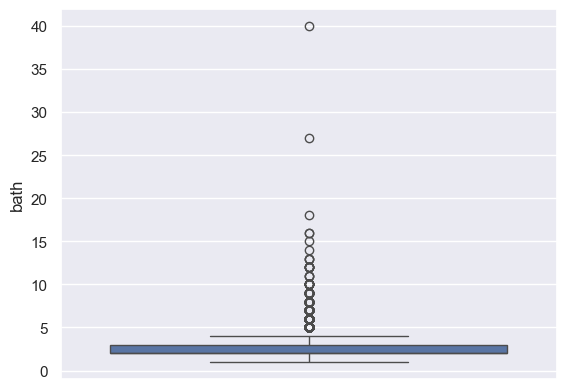

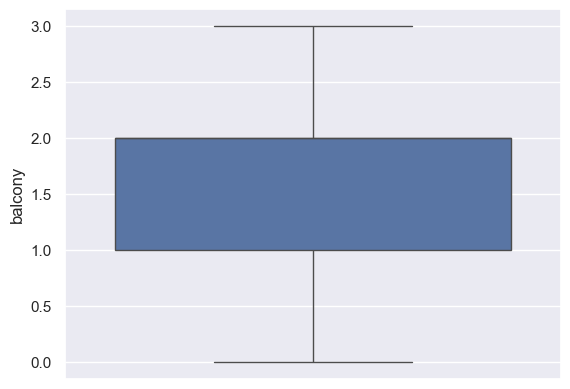

In [26]:
#for int/float columns any outlier, if outlier them impute with med else mean
col=['bath','balcony']

def boxplot(col):
    sns.boxplot(df[col])
    plt.show()

for i in col:
    boxplot(i)
    

In [27]:
df['bath']=df['bath'].fillna(df['bath'].median())
df['balcony']=df['balcony'].fillna(df['balcony'].mean())

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12791 entries, 0 to 13318
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     12791 non-null  object 
 1   availability  12791 non-null  object 
 2   location      12791 non-null  object 
 3   size          12791 non-null  object 
 4   total_sqft    12791 non-null  object 
 5   bath          12791 non-null  float64
 6   balcony       12791 non-null  float64
 7   price         12791 non-null  float64
dtypes: float64(3), object(5)
memory usage: 899.4+ KB


In [29]:
df.head()

,area_type,availability,location,size,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,1200,2.0,1.0,51.00


In [30]:
df['size'].value_counts()

size
2 BHK         4947
3 BHK         4120
4 Bedroom      824
4 BHK          574
3 Bedroom      535
1 BHK          521
2 Bedroom      314
5 Bedroom      291
6 Bedroom      191
1 Bedroom      104
8 Bedroom       84
7 Bedroom       82
5 BHK           59
9 Bedroom       46
6 BHK           30
7 BHK           17
1 RK            13
10 Bedroom      12
9 BHK            8
8 BHK            5
11 BHK           2
11 Bedroom       2
10 BHK           2
14 BHK           1
13 BHK           1
12 Bedroom       1
27 BHK           1
43 Bedroom       1
16 BHK           1
19 BHK           1
18 Bedroom       1
Name: count, dtype: int64

## Feature engineering

In [31]:
#extract from size the no of bhk 
df['bhk']=df['size'].apply(lambda x: int(x.split()[0]))

In [32]:
#dropping the size col as no use of it
df.drop(columns=['size'],axis=1,inplace=True)

In [33]:
df.head()

,area_type,availability,location,total_sqft,bath,balcony,price,bhk
0,Super built-up Area,19-Dec,Electronic City Phase II,1056,2.0,1.0,39.07,2
1,Plot Area,Ready To Move,Chikka Tirupathi,2600,5.0,3.0,120.00,4
2,Built-up Area,Ready To Move,Uttarahalli,1440,2.0,3.0,62.00,3
3,Super built-up Area,Ready To Move,Lingadheeranahalli,1521,3.0,1.0,95.00,3
4,Super built-up Area,Ready To Move,Kothanur,1200,2.0,1.0,51.00,2


In [34]:
df['total_sqft'].unique().tolist()

['1056',
 '2600',
 '1440',
 '1521',
 '1200',
 '1170',
 '2732',
 '3300',
 '1310',
 '1020',
 '1800',
 '2785',
 '1000',
 '1100',
 '2250',
 '1175',
 '1180',
 '1540',
 '2770',
 '600',
 '1755',
 '2800',
 '1767',
 '510',
 '1250',
 '660',
 '1610',
 '1151',
 '1025',
 '2100 - 2850',
 '1075',
 '1760',
 '1693',
 '1925',
 '700',
 '1070',
 '1724',
 '1290',
 '1143',
 '1296',
 '1254',
 '1330.74',
 '970',
 '1459',
 '800',
 '869',
 '1270',
 '1670',
 '2010',
 '1185',
 '1600',
 '3010 - 3410',
 '1500',
 '1407',
 '840',
 '4395',
 '845',
 '5700',
 '1160',
 '3000',
 '1140',
 '1220',
 '1350',
 '1005',
 '500',
 '1358',
 '1569',
 '1240',
 '2089',
 '1206',
 '1150',
 '2511',
 '460',
 '4400',
 '1660',
 '2957 - 3450',
 '1326',
 '1325',
 '1499',
 '1665',
 '708',
 '1060',
 '710',
 '1450',
 '2894',
 '1330',
 '2502',
 '650',
 '2400',
 '1007',
 '966',
 '1630',
 '1640',
 '782',
 '1260',
 '1413',
 '1116',
 '1530',
 '3700',
 '2497',
 '1436',
 '276',
 '1427',
 '2061',
 '3067 - 8156',
 '2650',
 '1282',
 '1050',
 '945',
 '950'

In [35]:
#The total_sqft columns exhibit inconsistency in data. While the sqfoot should be a scalar value, 
#some values are presented as ranges. 
#Therefore, it's required to handle and convert these values to scalar values.

def sqft_scalar(data):
    try:
        data = str(data).strip().lower()

        if '-' in data:
            left, right = data.split('-')
            left_num = ''.join([c for c in left if c.isdigit() or c == '.'])
            right_num = ''.join([c for c in right if c.isdigit() or c == '.'])
            return (float(left_num) + float(right_num)) / 2

        num_str = ''
        dot_found = False
        for c in data:
            if c.isdigit():
                num_str += c
            elif c == '.' and not dot_found:
                num_str += c
                dot_found = True

        if not num_str:
            return None
        num = float(num_str)

        if 'acre' in data:
            return num * 43560
        elif 'sq. meter' in data or 'sq meter' in data:
            return num * 10.7639
        elif 'sq. yard' in data or 'sq yard' in data:
            return num * 9
        elif 'perch' in data:
            return num * 272.25
        elif 'cent' in data or 'guntha' in data:
            return num * 435.6
        else:
            return num
    except:
        return None

In [36]:
df['total_sqft_new']=df['total_sqft'].apply(sqft_scalar)

In [37]:
df.isnull().sum()

area_type         0
availability      0
location          0
total_sqft        0
bath              0
balcony           0
price             0
bhk               0
total_sqft_new    0
dtype: int64

In [38]:
df.head()

,area_type,availability,location,total_sqft,bath,balcony,price,bhk,total_sqft_new
0,Super built-up Area,19-Dec,Electronic City Phase II,1056,2.0,1.0,39.07,2,1056.0
1,Plot Area,Ready To Move,Chikka Tirupathi,2600,5.0,3.0,120.00,4,2600.0
2,Built-up Area,Ready To Move,Uttarahalli,1440,2.0,3.0,62.00,3,1440.0
3,Super built-up Area,Ready To Move,Lingadheeranahalli,1521,3.0,1.0,95.00,3,1521.0
4,Super built-up Area,Ready To Move,Kothanur,1200,2.0,1.0,51.00,2,1200.0


In [39]:
df['total_sqft']=df['total_sqft_new']

In [40]:
df.head()

,area_type,availability,location,total_sqft,bath,balcony,price,bhk,total_sqft_new
0,Super built-up Area,19-Dec,Electronic City Phase II,1056.0,2.0,1.0,39.07,2,1056.0
1,Plot Area,Ready To Move,Chikka Tirupathi,2600.0,5.0,3.0,120.00,4,2600.0
2,Built-up Area,Ready To Move,Uttarahalli,1440.0,2.0,3.0,62.00,3,1440.0
3,Super built-up Area,Ready To Move,Lingadheeranahalli,1521.0,3.0,1.0,95.00,3,1521.0
4,Super built-up Area,Ready To Move,Kothanur,1200.0,2.0,1.0,51.00,2,1200.0


In [41]:
df=df.drop(['total_sqft_new'],axis=1)

In [42]:
df.head()

,area_type,availability,location,total_sqft,bath,balcony,price,bhk
0,Super built-up Area,19-Dec,Electronic City Phase II,1056.0,2.0,1.0,39.07,2
1,Plot Area,Ready To Move,Chikka Tirupathi,2600.0,5.0,3.0,120.00,4
2,Built-up Area,Ready To Move,Uttarahalli,1440.0,2.0,3.0,62.00,3
3,Super built-up Area,Ready To Move,Lingadheeranahalli,1521.0,3.0,1.0,95.00,3
4,Super built-up Area,Ready To Move,Kothanur,1200.0,2.0,1.0,51.00,2


In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12791 entries, 0 to 13318
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     12791 non-null  object 
 1   availability  12791 non-null  object 
 2   location      12791 non-null  object 
 3   total_sqft    12791 non-null  float64
 4   bath          12791 non-null  float64
 5   balcony       12791 non-null  float64
 6   price         12791 non-null  float64
 7   bhk           12791 non-null  int64  
dtypes: float64(4), int64(1), object(3)
memory usage: 899.4+ KB


In [44]:
#price per sqft
df['price_per_sqft'] = df['price'] / df['total_sqft']
df.head()

,area_type,availability,location,total_sqft,bath,balcony,price,bhk,price_per_sqft
0,Super built-up Area,19-Dec,Electronic City Phase II,1056.0,2.0,1.0,39.07,2,0.036998
1,Plot Area,Ready To Move,Chikka Tirupathi,2600.0,5.0,3.0,120.00,4,0.046154
2,Built-up Area,Ready To Move,Uttarahalli,1440.0,2.0,3.0,62.00,3,0.043056
3,Super built-up Area,Ready To Move,Lingadheeranahalli,1521.0,3.0,1.0,95.00,3,0.062459
4,Super built-up Area,Ready To Move,Kothanur,1200.0,2.0,1.0,51.00,2,0.042500


In [45]:
#sqft_per_bhk
df['sqft_per_bhk'] = df['total_sqft'] / df['bhk']

In [46]:
df['sqft_per_bhk'].head()

0    528.0
1    650.0
2    480.0
3    507.0
4    600.0
Name: sqft_per_bhk, dtype: float64

In [47]:
df['bath_per_bhk']=df['bath']/df['bhk']
df['balcony_per_bhk']=df['balcony']/df['bhk']
df['price_per_bhk']=df['price']/df['bhk']
df['price_per_balcony']=df['price']/df['balcony']

In [48]:
df.columns

Index(['area_type', 'availability', 'location', 'total_sqft', 'bath',
       'balcony', 'price', 'bhk', 'price_per_sqft', 'sqft_per_bhk',
       'bath_per_bhk', 'balcony_per_bhk', 'price_per_bhk',
       'price_per_balcony'],
      dtype='object')

In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12791 entries, 0 to 13318
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   area_type          12791 non-null  object 
 1   availability       12791 non-null  object 
 2   location           12791 non-null  object 
 3   total_sqft         12791 non-null  float64
 4   bath               12791 non-null  float64
 5   balcony            12791 non-null  float64
 6   price              12791 non-null  float64
 7   bhk                12791 non-null  int64  
 8   price_per_sqft     12791 non-null  float64
 9   sqft_per_bhk       12791 non-null  float64
 10  bath_per_bhk       12791 non-null  float64
 11  balcony_per_bhk    12791 non-null  float64
 12  price_per_bhk      12791 non-null  float64
 13  price_per_balcony  12791 non-null  float64
dtypes: float64(10), int64(1), object(3)
memory usage: 1.5+ MB


## Encoding

In [50]:
df['area_type'].unique()

array(['Super built-up  Area', 'Plot  Area', 'Built-up  Area',
       'Carpet  Area'], dtype=object)

In [51]:
df['availability'].unique()

array(['19-Dec', 'Ready To Move', '18-May', '18-Feb', '18-Nov', '20-Dec',
       '17-Oct', '21-Dec', '19-Sep', '20-Sep', '18-Mar', '20-Feb',
       '18-Apr', '20-Aug', '18-Oct', '19-Mar', '17-Sep', '18-Dec',
       '17-Aug', '19-Apr', '18-Jun', '22-Dec', '22-Jan', '18-Aug',
       '19-Jan', '17-Jul', '18-Jul', '21-Jun', '20-May', '19-Aug',
       '18-Sep', '17-May', '17-Jun', '21-May', '18-Jan', '20-Mar',
       '17-Dec', '16-Mar', '19-Jun', '22-Jun', '19-Jul', '21-Feb',
       'Immediate Possession', '19-May', '17-Nov', '20-Oct', '20-Jun',
       '19-Feb', '21-Oct', '21-Jan', '17-Mar', '17-Apr', '22-May',
       '19-Oct', '21-Jul', '21-Nov', '21-Mar', '16-Dec', '22-Mar',
       '20-Jan', '21-Sep', '21-Aug', '14-Nov', '19-Nov', '15-Nov',
       '16-Jul', '15-Jun', '17-Feb', '20-Nov', '20-Jul', '16-Sep',
       '15-Oct', '15-Dec', '16-Oct', '22-Nov', '15-Aug', '17-Jan',
       '16-Nov', '20-Apr', '16-Jan', '14-Jul'], dtype=object)

In [52]:
#Since  dataset is from 2017 the exact availability dates are not very 
#relevant for predicting price today & One-hot encoding will create a 
#huge sparse matrix, which may add noise rather than signal so will drop it

df=df.drop(['availability'],axis=1)

In [53]:
len(df['location'].unique().tolist())

#grouping the highest count of locations by counts ,bcz it will create 1305 columns
#which may introduce noise in the data and its not feasible for a model with too many features.

1305

In [54]:
location_counts=df['location'].value_counts(ascending=False)
top_10_location_by_counts=location_counts[:10].index
df['location']=df['location'].apply(lambda x: x if x in top_10_location_by_counts else 'others')

In [55]:
df

,area_type,location,total_sqft,bath,balcony,price,bhk,price_per_sqft,sqft_per_bhk,bath_per_bhk,balcony_per_bhk,price_per_bhk,price_per_balcony
0,Super built-up Area,others,1.056000e+03,2.0,1.000000,39.070,2,0.036998,528.000000,1.000000,0.500000,19.535000,39.070000
1,Plot Area,others,2.600000e+03,5.0,3.000000,120.000,4,0.046154,650.000000,1.250000,0.750000,30.000000,40.000000
2,Built-up Area,Uttarahalli,1.440000e+03,2.0,3.000000,62.000,3,0.043056,480.000000,0.666667,1.000000,20.666667,20.666667
3,Super built-up Area,others,1.521000e+03,3.0,1.000000,95.000,3,0.062459,507.000000,1.000000,0.333333,31.666667,95.000000
4,Super built-up Area,others,1.200000e+03,2.0,1.000000,51.000,2,0.042500,600.000000,1.000000,0.500000,25.500000,51.000000
5,Super built-up Area,Whitefield,1.170000e+03,2.0,1.000000,38.000,2,0.032479,585.000000,1.000000,0.500000,19.000000,38.000000
6,Super built-up Area,others,2.732000e+03,4.0,1.582308,204.000,4,0.074671,683.000000,1.000000,0.395577,51.000000,128.925630
7,Super built-up Area,others,3.300000e+03,4.0,1.582308,600.000,4,0.181818,825.000000,1.000000,0.395577,150.000000,379.193030
8,Super built-up Area,Marathahalli,1.310000e+03,3.0,1.000000,63.250,3,0.048282,436.666667,1.000000,0.333333,21.083333,63.250000
9,Plot Area,others,1.020000e+03,6.0,1.582308,370.000,6,0.362745,170.000000,1.000000,0.263718,61.666667,233.835702


In [56]:
df['location'].unique()

array(['others', 'Uttarahalli', 'Whitefield', 'Marathahalli',
       'Raja Rajeshwari Nagar', 'Thanisandra', 'Electronic City',
       'Yelahanka', 'Hebbal', 'Kanakpura Road', 'Sarjapur  Road'],
      dtype=object)

In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12791 entries, 0 to 13318
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   area_type          12791 non-null  object 
 1   location           12791 non-null  object 
 2   total_sqft         12791 non-null  float64
 3   bath               12791 non-null  float64
 4   balcony            12791 non-null  float64
 5   price              12791 non-null  float64
 6   bhk                12791 non-null  int64  
 7   price_per_sqft     12791 non-null  float64
 8   sqft_per_bhk       12791 non-null  float64
 9   bath_per_bhk       12791 non-null  float64
 10  balcony_per_bhk    12791 non-null  float64
 11  price_per_bhk      12791 non-null  float64
 12  price_per_balcony  12791 non-null  float64
dtypes: float64(10), int64(1), object(2)
memory usage: 1.4+ MB


-- so now categorical data sorted will apply one hot encoding
###### One hot encoding

In [58]:
df= pd.get_dummies(df,columns=['area_type','location'],drop_first=True,dtype=int)

In [59]:
df.head()

,total_sqft,bath,balcony,price,bhk,price_per_sqft,sqft_per_bhk,bath_per_bhk,balcony_per_bhk,price_per_bhk,price_per_balcony,area_type_Carpet Area,area_type_Plot Area,area_type_Super built-up Area,location_Hebbal,location_Kanakpura Road,location_Marathahalli,location_Raja Rajeshwari Nagar,location_Sarjapur Road,location_Thanisandra,location_Uttarahalli,location_Whitefield,location_Yelahanka,location_others
0,1056.0,2.0,1.0,39.07,2,0.036998,528.0,1.000000,0.500000,19.535000,39.070000,0,0,1,0,0,0,0,0,0,0,0,0,1
1,2600.0,5.0,3.0,120.00,4,0.046154,650.0,1.250000,0.750000,30.000000,40.000000,0,1,0,0,0,0,0,0,0,0,0,0,1
2,1440.0,2.0,3.0,62.00,3,0.043056,480.0,0.666667,1.000000,20.666667,20.666667,0,0,0,0,0,0,0,0,0,1,0,0,0
3,1521.0,3.0,1.0,95.00,3,0.062459,507.0,1.000000,0.333333,31.666667,95.000000,0,0,1,0,0,0,0,0,0,0,0,0,1
4,1200.0,2.0,1.0,51.00,2,0.042500,600.0,1.000000,0.500000,25.500000,51.000000,0,0,1,0,0,0,0,0,0,0,0,0,1


## Outlier detection and treatment:

In [60]:
df.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
total_sqft,12791.0,1932.74,17625.82,1.00,1100.00,1282.00,1693.00,1306800.0
bath,12791.0,2.70,1.35,1.00,2.00,2.00,3.00,40.0
balcony,12791.0,1.58,0.80,0.00,1.00,2.00,2.00,3.0
price,12791.0,114.32,151.48,8.00,50.00,73.00,121.00,3600.0
bhk,12791.0,2.82,1.31,1.00,2.00,3.00,3.00,43.0
price_per_sqft,12791.0,0.08,1.16,0.00,0.04,0.05,0.07,120.0
sqft_per_bhk,12791.0,706.43,6685.03,0.25,473.33,552.50,627.50,653400.0
bath_per_bhk,12791.0,0.97,0.18,0.25,1.00,1.00,1.00,2.0
balcony_per_bhk,12791.0,0.62,0.34,0.00,0.40,0.50,1.00,3.0
price_per_bhk,12791.0,38.47,37.03,3.33,21.72,29.33,41.67,750.0


In [61]:
#price per balcony have inf value may be its due to 0 denominator so (anything/0) is inf ml cant handle it
#replace balcony whereever its 0 replace to 1


df['balcony'].replace(0, 1, inplace=True)

df['price_per_balcony'] = df['price'] / df['balcony']

In [62]:
df['price_per_balcony'].describe().T.round(2)

count    12791.00
mean        75.92
std         98.56
min          5.00
25%         31.50
50%         50.00
75%         80.00
max       2275.16
Name: price_per_balcony, dtype: float64

In [63]:
df.columns

Index(['total_sqft', 'bath', 'balcony', 'price', 'bhk', 'price_per_sqft',
       'sqft_per_bhk', 'bath_per_bhk', 'balcony_per_bhk', 'price_per_bhk',
       'price_per_balcony', 'area_type_Carpet  Area', 'area_type_Plot  Area',
       'area_type_Super built-up  Area', 'location_Hebbal',
       'location_Kanakpura Road', 'location_Marathahalli',
       'location_Raja Rajeshwari Nagar', 'location_Sarjapur  Road',
       'location_Thanisandra', 'location_Uttarahalli', 'location_Whitefield',
       'location_Yelahanka', 'location_others'],
      dtype='object')

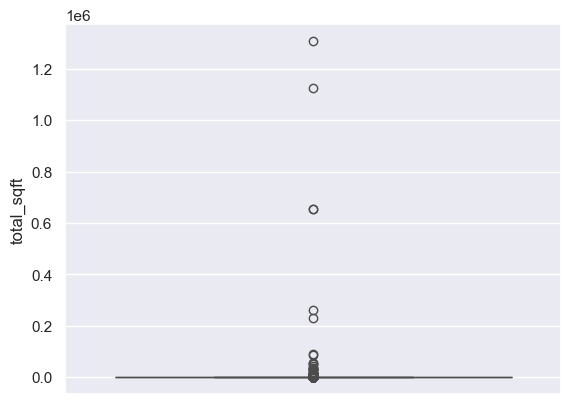

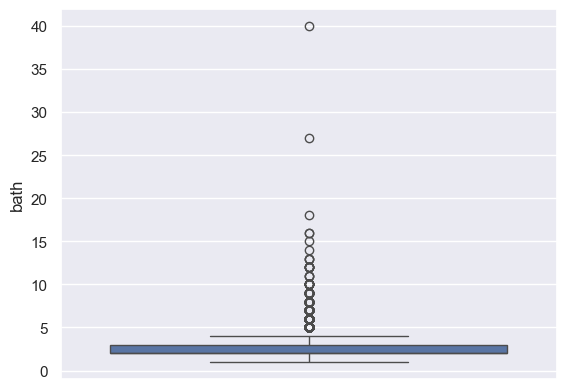

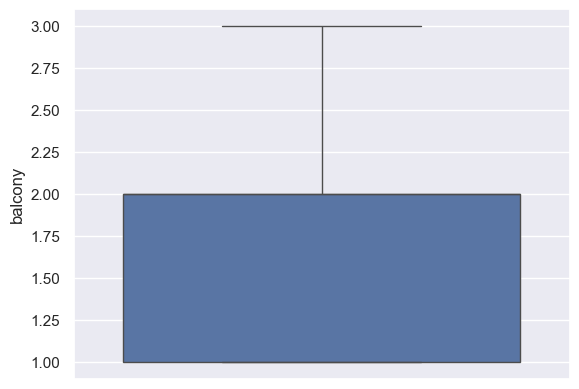

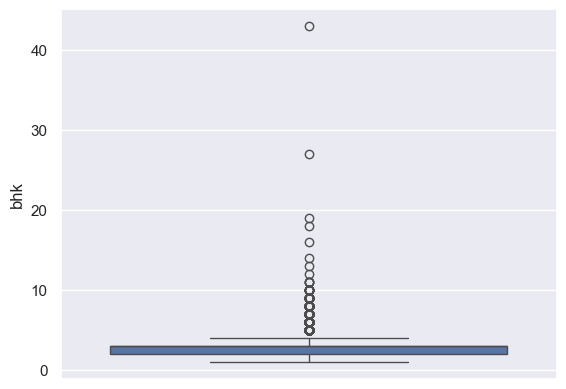

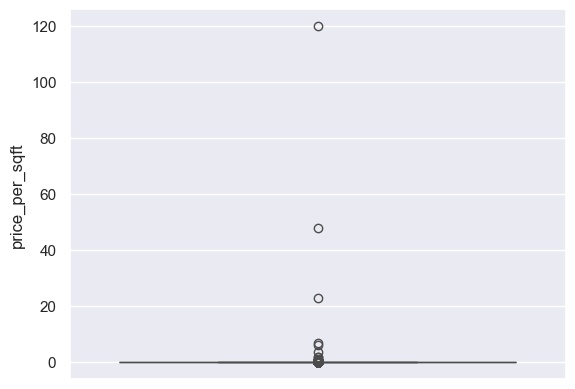

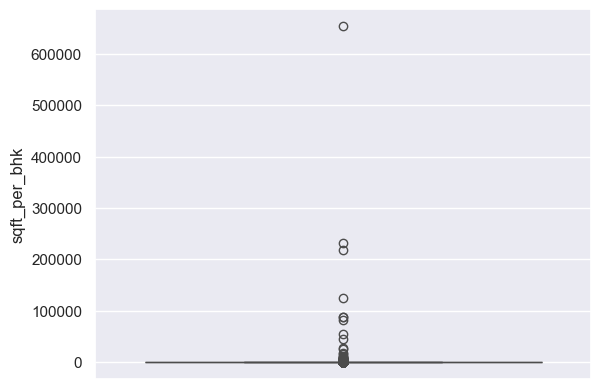

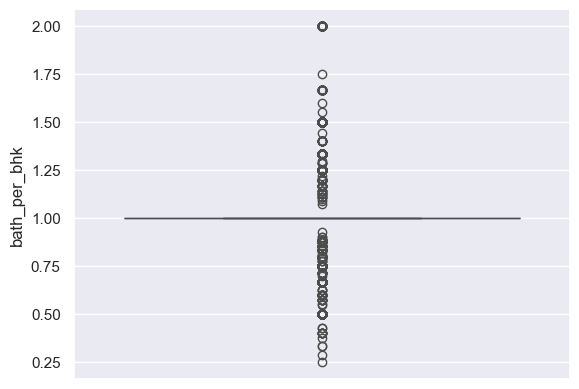

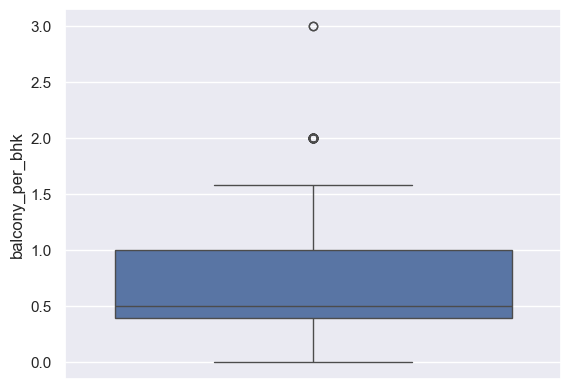

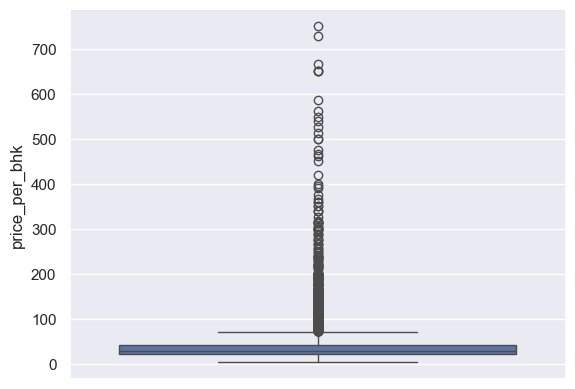

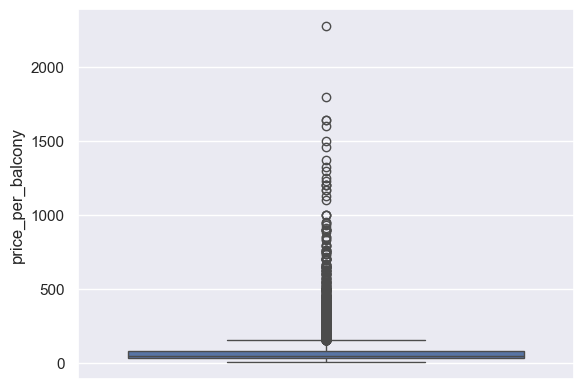

In [64]:
col=['total_sqft', 'bath', 'balcony', 'bhk', 'price_per_sqft',
       'sqft_per_bhk', 'bath_per_bhk', 'balcony_per_bhk', 'price_per_bhk',
       'price_per_balcony']

def boxplot(col):
    sns.boxplot(df[col])
    plt.show()

for i in col:
    boxplot(i)

In [65]:
col=['total_sqft', 'bath', 'balcony', 'price', 'bhk', 'price_per_sqft',
       'sqft_per_bhk', 'bath_per_bhk', 'balcony_per_bhk', 'price_per_bhk',
       'price_per_balcony']
df[col].skew()

total_sqft           60.198526
bath                  4.215840
balcony               0.599027
price                 7.954354
bhk                   4.802599
price_per_sqft       91.566071
sqft_per_bhk         79.723164
bath_per_bhk          0.550477
balcony_per_bhk       0.422628
price_per_bhk         7.031801
price_per_balcony     6.853068
dtype: float64

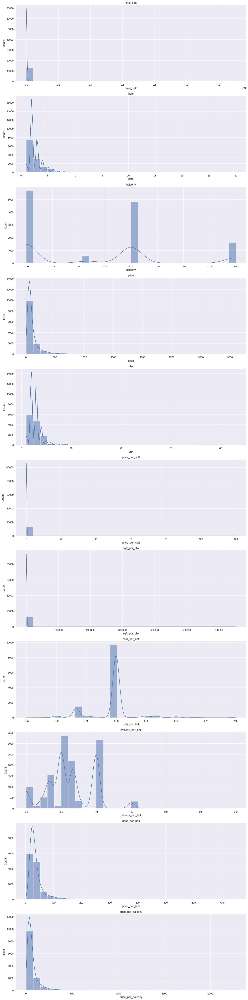

In [66]:
col=['total_sqft', 'bath', 'balcony', 'price', 'bhk', 'price_per_sqft',
       'sqft_per_bhk', 'bath_per_bhk', 'balcony_per_bhk', 'price_per_bhk',
       'price_per_balcony']

plt.figure(figsize=(15, 60))  # Make the figure taller for multiple subplots

for i, c in enumerate(col,1):
    plt.subplot(len(col), 1, i)  # Subplots: nrows=len(col), ncols=1, index=i
    sns.histplot(df[c], kde=True, bins=30)  # Plot each column
    plt.title(c)

plt.tight_layout()
plt.show()

In [67]:
col=['total_sqft', 'bath', 'bhk', 'price_per_sqft',
       'sqft_per_bhk', 'price_per_bhk','price_per_balcony']

In [68]:
# will handle the outlier first 

In [69]:
# outlier for total_sqft

Q1=np.percentile(df['total_sqft'],25)
Q3=np.percentile(df['total_sqft'],75)

IQR=Q3-Q1

upper_limit=Q3+1.5*IQR
lower_limit=Q1-1.5*IQR

df['total_sqft']=np.where(
    df['total_sqft']> upper_limit,upper_limit,
    np.where(df['total_sqft']<lower_limit,lower_limit,
    df['total_sqft'])
)

In [70]:
# outlier for bath

Q1=np.percentile(df['bath'],25)
Q3=np.percentile(df['bath'],75)

IQR=Q3-Q1

upper_limit=Q3+1.5*IQR
lower_limit=Q1-1.5*IQR

df['bath']=np.where(
    df['bath']> upper_limit,upper_limit,
    np.where(df['bath']<lower_limit,lower_limit,
    df['bath'])
)

# outlier for bhk

Q1=np.percentile(df['bhk'],25)
Q3=np.percentile(df['bhk'],75)

IQR=Q3-Q1

upper_limit=Q3+1.5*IQR
lower_limit=Q1-1.5*IQR

df['bhk']=np.where(
    df['bhk']> upper_limit,upper_limit,
    np.where(df['bhk']<lower_limit,lower_limit,
    df['bhk'])
)

# outlier for price_per_sqft

Q1=np.percentile(df['price_per_sqft'],25)
Q3=np.percentile(df['price_per_sqft'],75)

IQR=Q3-Q1

upper_limit=Q3+1.5*IQR
lower_limit=Q1-1.5*IQR

df['price_per_sqft']=np.where(
    df['price_per_sqft']> upper_limit,upper_limit,
    np.where(df['price_per_sqft']<lower_limit,lower_limit,
    df['price_per_sqft'])
)

# outlier for sqft_per_bhk

Q1=np.percentile(df['sqft_per_bhk'],25)
Q3=np.percentile(df['sqft_per_bhk'],75)

IQR=Q3-Q1

upper_limit=Q3+1.5*IQR
lower_limit=Q1-1.5*IQR

df['sqft_per_bhk']=np.where(
    df['sqft_per_bhk']> upper_limit,upper_limit,
    np.where(df['sqft_per_bhk']<lower_limit,lower_limit,
    df['sqft_per_bhk'])
)

# outlier for price_per_bhk

Q1=np.percentile(df['price_per_bhk'],25)
Q3=np.percentile(df['price_per_bhk'],75)

IQR=Q3-Q1

upper_limit=Q3+1.5*IQR
lower_limit=Q1-1.5*IQR

df['price_per_bhk']=np.where(
    df['price_per_bhk']> upper_limit,upper_limit,
    np.where(df['price_per_bhk']<lower_limit,lower_limit,
    df['price_per_bhk'])
)

# outlier for price_per_balcony

Q1=np.percentile(df['price_per_balcony'],25)
Q3=np.percentile(df['price_per_balcony'],75)

IQR=Q3-Q1

upper_limit=Q3+1.5*IQR
lower_limit=Q1-1.5*IQR

df['price_per_balcony']=np.where(
    df['price_per_balcony']> upper_limit,upper_limit,
    np.where(df['price_per_balcony']<lower_limit,lower_limit,
    df['price_per_balcony'])
)

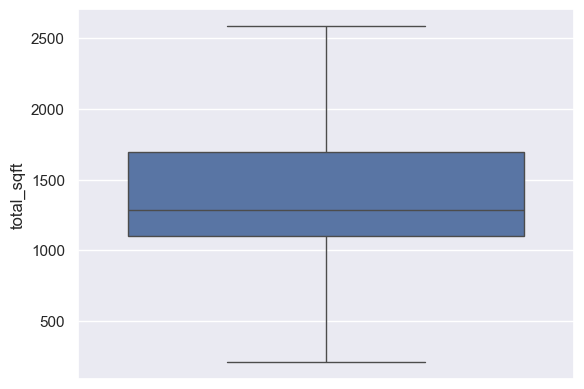

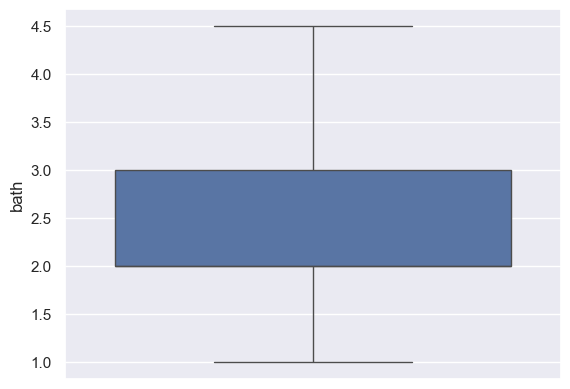

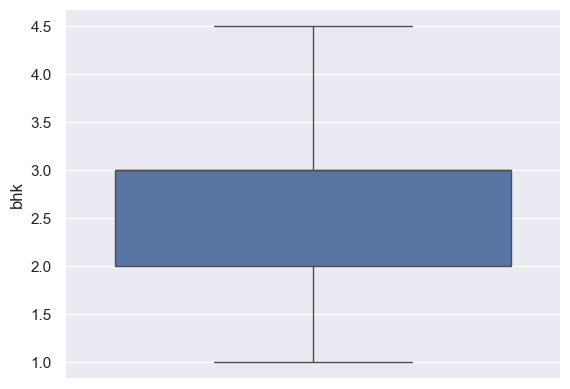

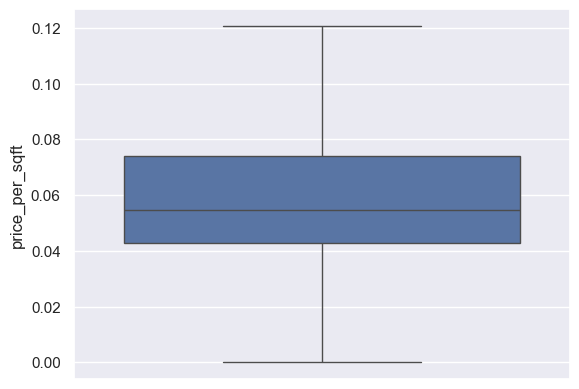

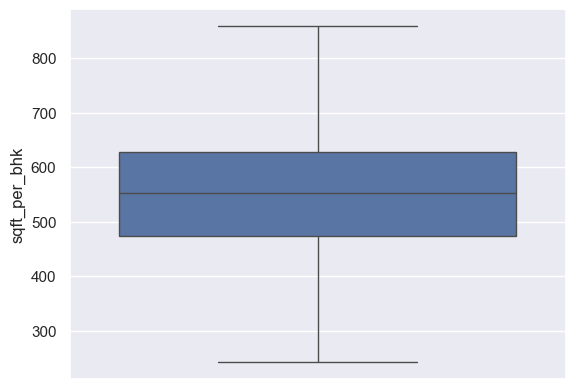

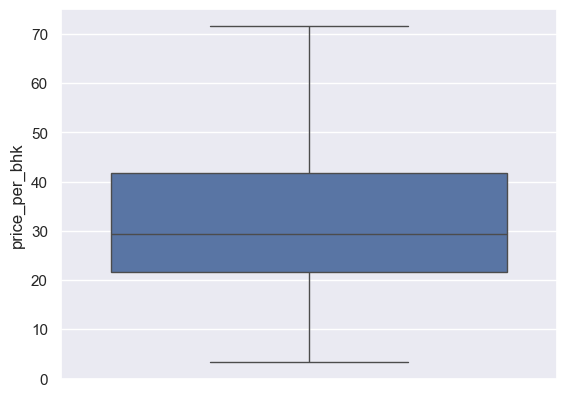

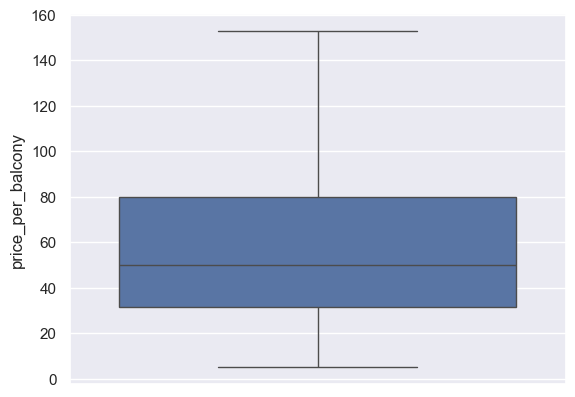

In [71]:
col=['total_sqft', 'bath', 'bhk', 'price_per_sqft',
       'sqft_per_bhk', 'price_per_bhk','price_per_balcony']

def boxplot(col):
    sns.boxplot(df[col])
    plt.show()

for i in col:
    boxplot(i)

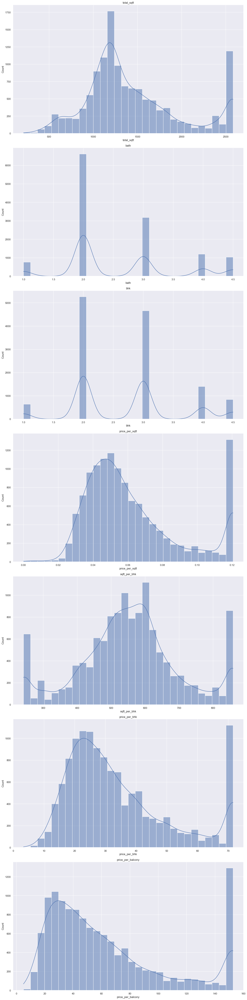

In [72]:
col=['total_sqft', 'bath', 'bhk', 'price_per_sqft',
       'sqft_per_bhk', 'price_per_bhk','price_per_balcony']

plt.figure(figsize=(15, 60))  # Make the figure taller for multiple subplots

for i, c in enumerate(col,1):
    plt.subplot(len(col), 1, i)  # Subplots: nrows=len(col), ncols=1, index=i
    sns.histplot(df[c], kde=True, bins=30)  # Plot each column
    plt.title(c)

plt.tight_layout()
plt.show()

In [73]:
df[col].skew()

total_sqft           0.771355
bath                 0.668680
bhk                  0.372170
price_per_sqft       0.955643
sqft_per_bhk         0.054917
price_per_bhk        0.989661
price_per_balcony    1.031743
dtype: float64

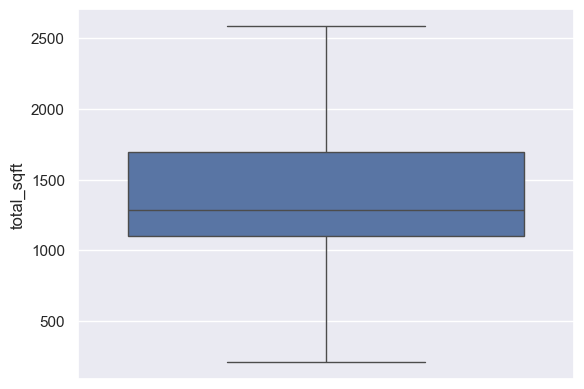

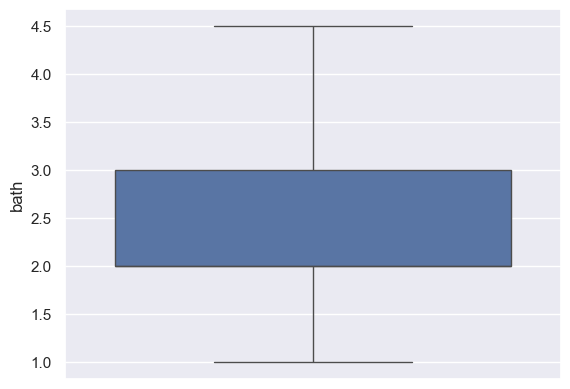

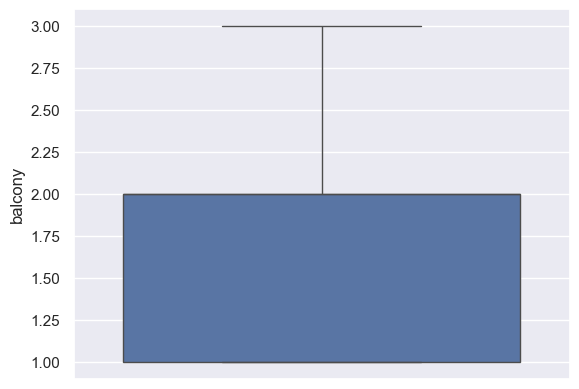

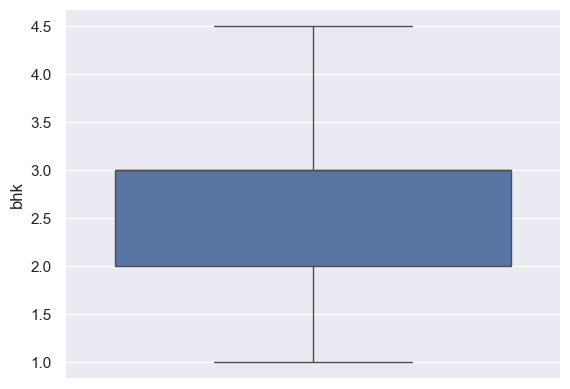

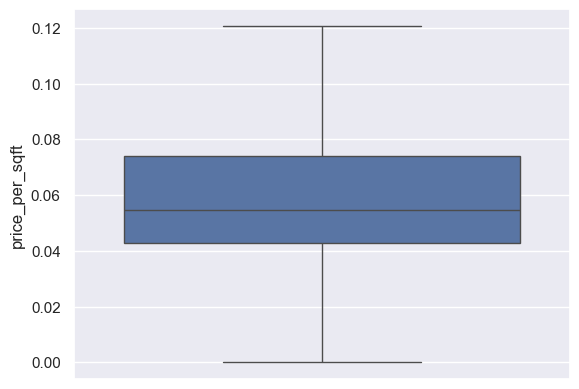

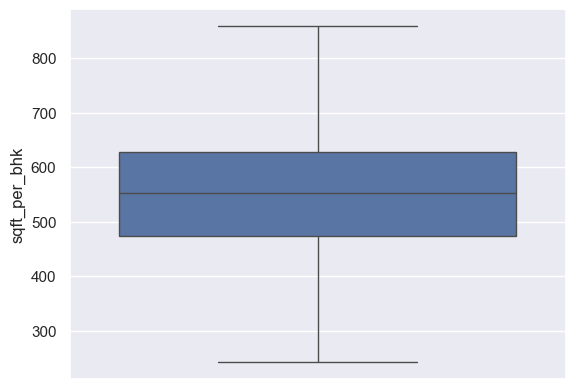

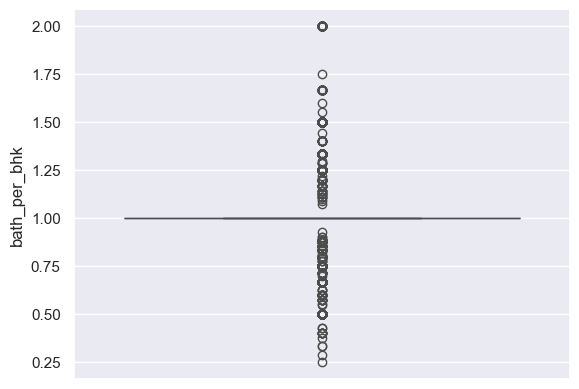

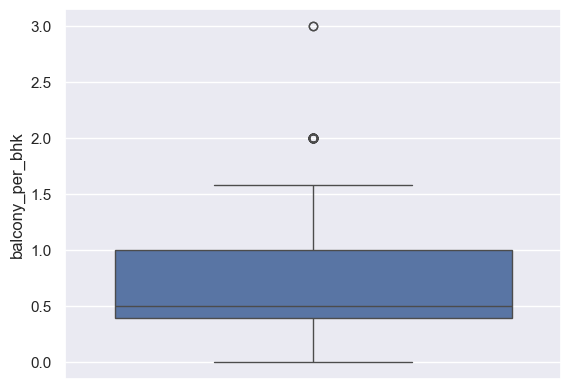

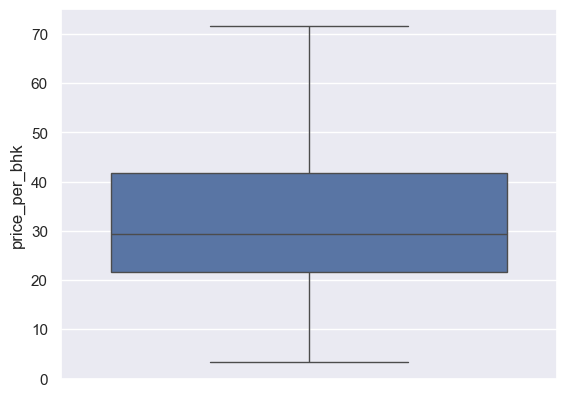

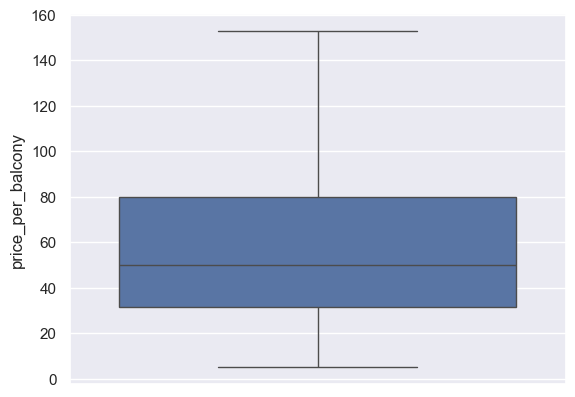

In [74]:
col=['total_sqft', 'bath', 'balcony', 'bhk', 'price_per_sqft',
     'sqft_per_bhk', 'bath_per_bhk', 'balcony_per_bhk', 'price_per_bhk',
       'price_per_balcony']

def boxplot(col):
    sns.boxplot(df[col])
    plt.show()

for i in col:
    boxplot(i)

In [75]:
#As observed from the data, there are no outliers now. However, the data still shows positive 
#skewness or right tails in each feature. To handle this issue we must ensure the data’s perfectly 
#stable for further analysis, we will apply the boxcox log transformation.

In [76]:
cols=['total_sqft', 'bath', 'bhk', 'price_per_sqft',
       'sqft_per_bhk', 'price_per_bhk','price_per_balcony']

from scipy.stats import boxcox

for col in cols:
    df[col], _ = boxcox(df[col] + 1e-6)

In [77]:
df[cols].skew()

total_sqft           0.006062
bath                -0.001047
bhk                 -0.014478
price_per_sqft       0.082542
sqft_per_bhk         0.002587
price_per_bhk        0.003854
price_per_balcony    0.004849
dtype: float64

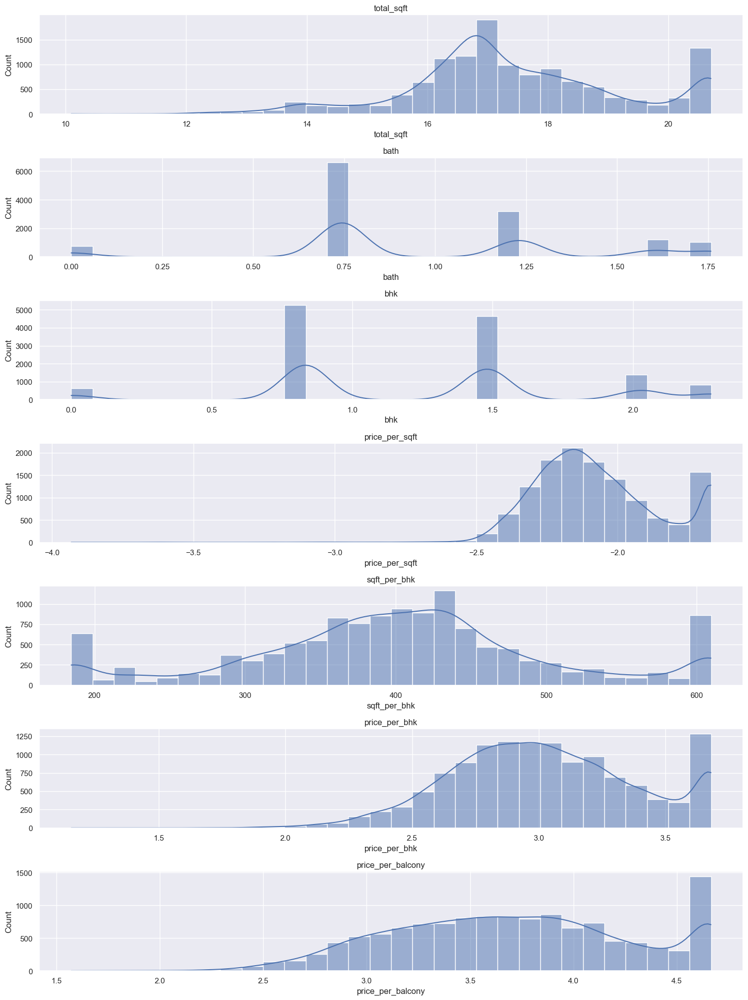

In [78]:
col=['total_sqft', 'bath', 'bhk', 'price_per_sqft',
       'sqft_per_bhk', 'price_per_bhk','price_per_balcony']

plt.figure(figsize=(15, 20))  # Make the figure taller for multiple subplots

for i, c in enumerate(col,1):
    plt.subplot(len(col), 1, i)  
    sns.histplot(df[c], kde=True, bins=30)  
    plt.title(c)

plt.tight_layout()
plt.show()

##### now data almost less skewed data but yes some features are mild positived skewd but thats fine futher.

## CorRelation of data

In [79]:
cols=['total_sqft', 'bath', 'balcony', 'price', 'bhk', 'price_per_sqft',
       'sqft_per_bhk', 'bath_per_bhk', 'balcony_per_bhk', 'price_per_bhk',
       'price_per_balcony']
df[cols].corr().round(2)

,total_sqft,bath,balcony,price,bhk,price_per_sqft,sqft_per_bhk,bath_per_bhk,balcony_per_bhk,price_per_bhk,price_per_balcony
total_sqft,1.00,0.65,0.29,0.50,0.63,0.21,0.56,0.11,-0.14,0.53,0.53
bath,0.65,1.00,0.30,0.45,0.87,0.44,-0.03,0.34,-0.26,0.28,0.50
balcony,0.29,0.30,1.00,0.12,0.28,0.07,0.07,0.04,0.67,0.09,-0.35
price,0.50,0.45,0.12,1.00,0.44,0.52,0.31,0.15,-0.16,0.54,0.53
bhk,0.63,0.87,0.28,0.44,1.00,0.42,-0.19,-0.13,-0.36,0.16,0.49
price_per_sqft,0.21,0.44,0.07,0.52,0.42,1.00,-0.04,0.12,-0.20,0.71,0.70
sqft_per_bhk,0.56,-0.03,0.07,0.31,-0.19,-0.04,1.00,0.34,0.17,0.58,0.24
bath_per_bhk,0.11,0.34,0.04,0.15,-0.13,0.12,0.34,1.00,0.12,0.31,0.12
balcony_per_bhk,-0.14,-0.26,0.67,-0.16,-0.36,-0.20,0.17,0.12,1.00,-0.03,-0.62
price_per_bhk,0.53,0.28,0.09,0.54,0.16,0.71,0.58,0.31,-0.03,1.00,0.72


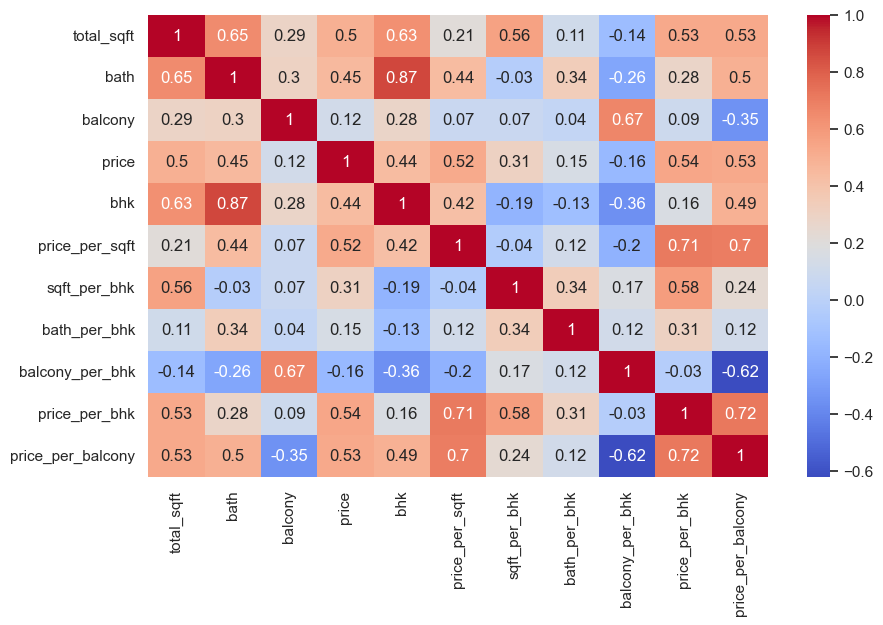

In [80]:
plt.figure(figsize=(10,6))
sns.heatmap(df[cols].corr().round(2), annot=True, cmap='coolwarm')
plt.show()

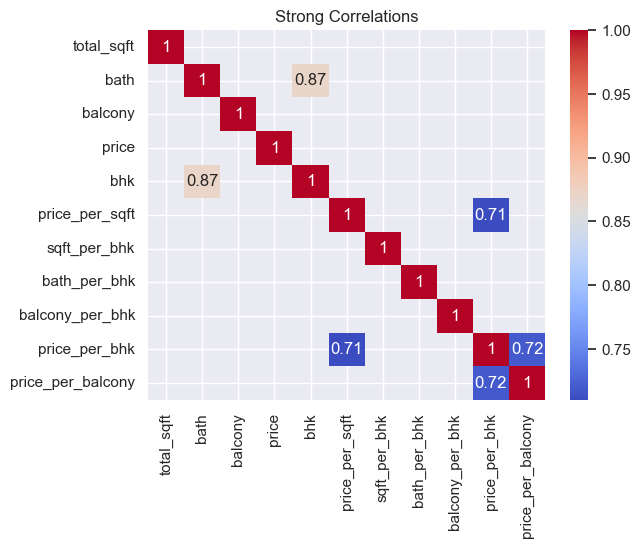

In [81]:
#is_multicollinearity cols among with themself?
threshold=0.7
corr_matrix = df[cols].corr().round(2)
multicoll_matrix=corr_matrix[np.abs(corr_matrix)>threshold]

multi_corr_map=corr_matrix[np.abs(corr_matrix)>threshold]


sns.heatmap(multi_corr_map, annot=True, cmap="coolwarm")
plt.title("Strong Correlations")
plt.show()

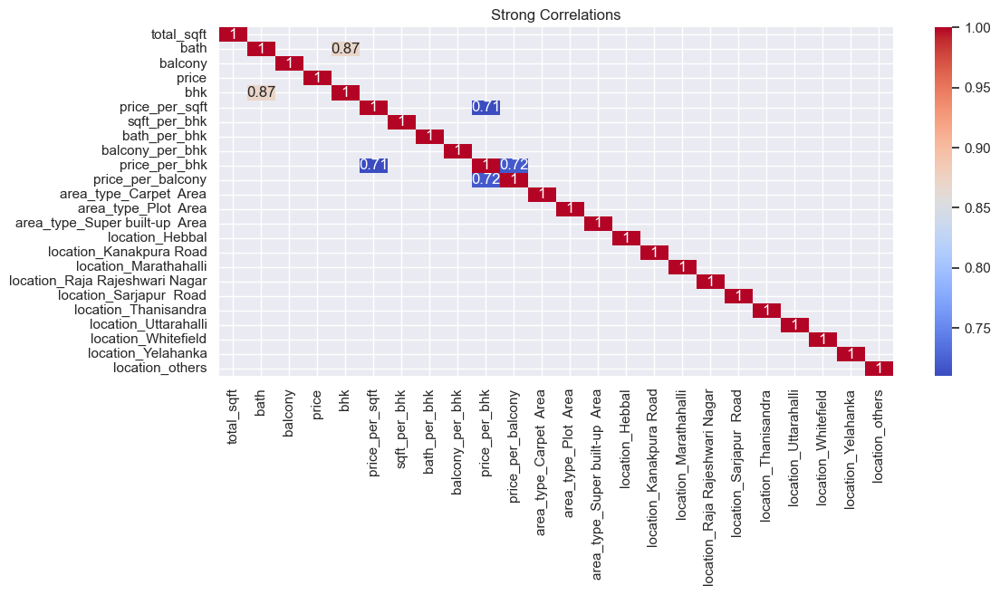

In [82]:
#overall corr to check any corel with encoding data --but no multi col with enc and target

corr_matrix = df.corr().round(2)
multicoll_matrix=corr_matrix[np.abs(corr_matrix)>0.7]

multi_corr_map=corr_matrix[np.abs(corr_matrix)>0.70]

plt.figure(figsize=(12,5))
sns.heatmap(multi_corr_map, annot=True, cmap="coolwarm")
plt.title("Strong Correlations")
plt.show()

### !Multicollinearity exist within independent data!
- there is no multcol with encoded data but other col are having multicol with themself 
- bhk with bathroom and vice versa
- price/bhk with price/sqrft and vice versa
- price/balcony with price/bhk and vice versa

###### we will use vif once we have done feature scalling and splitting data

## Feature Scalling

In [83]:
#splitting the data

x=df.drop(['price'],axis=1)
y=df['price']

In [84]:
x.shape

(12791, 23)

In [85]:
y.shape

(12791,)

In [86]:
x.head(2)

,total_sqft,bath,balcony,bhk,price_per_sqft,sqft_per_bhk,bath_per_bhk,balcony_per_bhk,price_per_bhk,price_per_balcony,area_type_Carpet Area,area_type_Plot Area,area_type_Super built-up Area,location_Hebbal,location_Kanakpura Road,location_Marathahalli,location_Raja Rajeshwari Nagar,location_Sarjapur Road,location_Thanisandra,location_Uttarahalli,location_Whitefield,location_Yelahanka,location_others
0,16.244687,0.744136,1.0,0.833999,-2.300598,385.320474,1.00,0.50,2.677756,3.469752,0,0,1,0,0,0,0,0,0,0,0,0,1
1,20.704396,1.758188,3.0,2.028481,-2.195390,468.740308,1.25,0.75,3.019388,3.490804,0,1,0,0,0,0,0,0,0,0,0,0,1


In [87]:
y.head()

0     39.07
1    120.00
2     62.00
3     95.00
4     51.00
Name: price, dtype: float64

In [88]:
from sklearn.preprocessing import StandardScaler
scalar=StandardScaler()
x_scalar=scalar.fit_transform(x)
x_scalar=pd.DataFrame(data=x_scalar,columns=x.columns)
x_scalar.head(2)

,total_sqft,bath,balcony,bhk,price_per_sqft,sqft_per_bhk,bath_per_bhk,balcony_per_bhk,price_per_bhk,price_per_balcony,area_type_Carpet Area,area_type_Plot Area,area_type_Super built-up Area,location_Hebbal,location_Kanakpura Road,location_Marathahalli,location_Raja Rajeshwari Nagar,location_Sarjapur Road,location_Thanisandra,location_Uttarahalli,location_Whitefield,location_Yelahanka,location_others
0,-0.661915,-0.552435,-0.967286,-0.759752,-1.016866,-0.175661,0.175905,-0.346498,-0.935498,-0.408638,-0.082754,-0.429107,0.733440,-0.112905,-0.140902,-0.115712,-0.112192,-0.174743,-0.135017,-0.111475,-0.206679,-0.129197,0.495819
1,1.822232,1.795793,1.958258,1.407018,-0.535282,0.651952,1.560493,0.390465,-0.010984,-0.372023,-0.082754,2.330423,-1.363438,-0.112905,-0.140902,-0.115712,-0.112192,-0.174743,-0.135017,-0.111475,-0.206679,-0.129197,0.495819


In [89]:
x_scalar.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
total_sqft,12791.0,-0.0,1.0,-4.09,-0.56,-0.16,0.59,1.82
bath,12791.0,0.0,1.0,-2.28,-0.55,-0.55,0.57,1.80
balcony,12791.0,-0.0,1.0,-0.97,-0.97,0.50,0.50,1.96
bhk,12791.0,0.0,1.0,-2.27,-0.76,0.41,0.41,1.86
price_per_sqft,12791.0,0.0,1.0,-8.48,-0.69,-0.14,0.58,1.87
sqft_per_bhk,12791.0,-0.0,1.0,-2.17,-0.55,-0.01,0.50,2.05
bath_per_bhk,12791.0,-0.0,1.0,-3.98,0.18,0.18,0.18,5.71
balcony_per_bhk,12791.0,0.0,1.0,-1.82,-0.65,-0.35,1.13,7.02
price_per_bhk,12791.0,0.0,1.0,-5.06,-0.70,-0.06,0.68,1.78
price_per_balcony,12791.0,0.0,1.0,-3.71,-0.75,-0.03,0.70,1.67


In [90]:
# will check vif using scalled data 

from statsmodels.stats.outliers_influence import variance_inflation_factor
variable=x_scalar
vif=pd.DataFrame()
vif['VIF_']=[variance_inflation_factor(variable,i) for i in range (variable.shape[1])]
vif['feat_name']=x.columns

In [91]:
vif.sort_values(by='VIF_',ascending=False).reset_index(drop=True)

,VIF_,feat_name
0,29.550506,bhk
1,29.198239,bath
2,22.933142,price_per_balcony
3,16.337983,price_per_bhk
4,12.653681,total_sqft
5,8.933810,balcony
6,8.503014,price_per_sqft
7,7.494193,bath_per_bhk
8,7.413777,location_others
9,6.565837,sqft_per_bhk


In [92]:
#dropping the highest vif (bhk)one 

x_scalar=x_scalar.drop(['bhk'],axis=1)
x_scalar.columns

Index(['total_sqft', 'bath', 'balcony', 'price_per_sqft', 'sqft_per_bhk',
       'bath_per_bhk', 'balcony_per_bhk', 'price_per_bhk', 'price_per_balcony',
       'area_type_Carpet  Area', 'area_type_Plot  Area',
       'area_type_Super built-up  Area', 'location_Hebbal',
       'location_Kanakpura Road', 'location_Marathahalli',
       'location_Raja Rajeshwari Nagar', 'location_Sarjapur  Road',
       'location_Thanisandra', 'location_Uttarahalli', 'location_Whitefield',
       'location_Yelahanka', 'location_others'],
      dtype='object')

In [93]:
# recheck vif after removing any impact 

variable=x_scalar
vif=pd.DataFrame()
vif['VIF_']=[variance_inflation_factor(variable,i) for i in range (variable.shape[1])]
vif['feat_name']=x_scalar.columns

vif_test1=vif.sort_values(by='VIF_',ascending=False).reset_index(drop=True)
vif_test1

,VIF_,feat_name
0,22.360220,price_per_balcony
1,15.333923,price_per_bhk
2,12.297175,bath
3,11.733282,total_sqft
4,8.535748,balcony
5,8.251414,price_per_sqft
6,7.413536,location_others
7,6.451951,sqft_per_bhk
8,4.566934,balcony_per_bhk
9,3.789328,bath_per_bhk


In [94]:
x_scalar=x_scalar.drop(['price_per_balcony'],axis=1)
x_scalar.columns

Index(['total_sqft', 'bath', 'balcony', 'price_per_sqft', 'sqft_per_bhk',
       'bath_per_bhk', 'balcony_per_bhk', 'price_per_bhk',
       'area_type_Carpet  Area', 'area_type_Plot  Area',
       'area_type_Super built-up  Area', 'location_Hebbal',
       'location_Kanakpura Road', 'location_Marathahalli',
       'location_Raja Rajeshwari Nagar', 'location_Sarjapur  Road',
       'location_Thanisandra', 'location_Uttarahalli', 'location_Whitefield',
       'location_Yelahanka', 'location_others'],
      dtype='object')

In [95]:
# recheck vif2 after removing any impact 

variable=x_scalar
vif=pd.DataFrame()
vif['VIF_']=[variance_inflation_factor(variable,i) for i in range (variable.shape[1])]
vif['feat_name']=x_scalar.columns

vif_test2=vif.sort_values(by='VIF_',ascending=False).reset_index(drop=True)
vif_test2

,VIF_,feat_name
0,10.986346,total_sqft
1,10.354659,bath
2,9.969175,price_per_bhk
3,7.433473,price_per_sqft
4,7.409066,location_others
5,6.438359,sqft_per_bhk
6,4.179457,balcony_per_bhk
7,3.949391,balcony
8,3.390739,bath_per_bhk
9,2.772413,location_Whitefield


In [96]:
x_scalar=x_scalar.drop(['price_per_bhk'],axis=1)

variable=x_scalar
vif=pd.DataFrame()
vif['VIF_']=[variance_inflation_factor(variable,i) for i in range (variable.shape[1])]
vif['feat_name']=x_scalar.columns

vif_test3=vif.sort_values(by='VIF_',ascending=False).reset_index(drop=True)
vif_test3

,VIF_,feat_name
0,8.848474,total_sqft
1,8.743973,bath
2,7.400795,location_others
3,5.685192,sqft_per_bhk
4,4.156334,balcony_per_bhk
5,3.933657,balcony
6,3.010097,bath_per_bhk
7,2.768398,location_Whitefield
8,2.288590,location_Sarjapur Road
9,1.937555,area_type_Plot Area


In [109]:
x_scalar=x_scalar.reset_index(drop=True)

## EDA Reports:

In [97]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="EDA for Bangalore data Housing Price")
profile.to_file("eda_bangalore_housing_price.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████| 24/24 [00:00<00:00, 200.44it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Model Building-

## 

In [110]:
#splitting the data into training and testing set using_scalled data

from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x_scalar,y,train_size=0.8,random_state=42)

In [111]:
print(f"x train = {x_train.shape},x test ={x_test.shape}, y- train= {y_train.shape},ytest={y_test.shape}")

x train = (10232, 20),x test =(2559, 20), y- train= (10232,),ytest=(2559,)


#### using OLS method:

In [113]:
from statsmodels.regression.linear_model import OLS 
import statsmodels.regression.linear_model as smf 


regression = smf.OLS(endog=y_train.reset_index(drop=True), exog= x_train.reset_index(drop=True)).fit() 
regression.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.296
Model:                            OLS   Adj. R-squared (uncentered):              0.295
Method:                 Least Squares   F-statistic:                              215.2
Date:                Tue, 30 Sep 2025   Prob (F-statistic):                        0.00
Time:                        00:55:25   Log-Likelihood:                         -66411.
No. Observations:               10232   AIC:                                  1.329e+05
Df Residuals:                   10212   BIC:                                  1.330e+05
Df Model:                          20                                                  
Covariance Type:            nonrobust                                                  
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
total_sqft                         9.9501      4.687      2.123      0.034       0.763      19.137
bath                              36.9951      4.676      7.912      0.000      27.830      46.160
balcony                            2.5362      3.142      0.807      0.420      -3.622       8.694
price_per_sqft                    54.1240      1.922     28.163      0.000      50.357      57.891
sqft_per_bhk                      56.5178      3.762     15.022      0.000      49.143      63.893
bath_per_bhk                     -15.4846      2.724     -5.684      0.000     -20.825     -10.145
balcony_per_bhk                   -7.3852      3.243     -2.277      0.023     -13.742      -1.029
area_type_Carpet  Area             1.0267      1.549      0.663      0.508      -2.011       4.064
area_type_Plot  Area              16.3429      2.204      7.417      0.000      12.023      20.662
area_type_Super built-up  Area    -1.0643      2.002     -0.532      0.595      -4.989       2.861
location_Hebbal                   -4.3460      2.039     -2.132      0.033      -8.342      -0.350
location_Kanakpura Road           -2.4022      2.176     -1.104      0.270      -6.668       1.864
location_Marathahalli             -3.7827      1.980     -1.910      0.056      -7.665       0.099
location_Raja Rajeshwari Nagar    -1.7364      2.005     -0.866      0.386      -5.666       2.193
location_Sarjapur  Road           -6.0149      2.448     -2.457      0.014     -10.814      -1.216
location_Thanisandra              -4.7491      2.125     -2.234      0.025      -8.915      -0.583
location_Uttarahalli              -0.0157      1.959     -0.008      0.994      -3.855       3.824
location_Whitefield               -5.5147      2.690     -2.050      0.040     -10.788      -0.241
location_Yelahanka                -3.3225      2.080     -1.597      0.110      -7.399       0.755
location_others                   -5.5721      4.439     -1.255      0.209     -14.274       3.129
==============================================================================
Omnibus:                    17872.184   Durbin-Watson:                   0.984
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         22706457.320
Skew:                          12.317   Prob(JB):                         0.00
Kurtosis:                     232.462   Cond. No.                         7.67
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [114]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,train_size=0.8,random_state=42)


from statsmodels.regression.linear_model import OLS 
import statsmodels.regression.linear_model as smf 


regression = smf.OLS(endog=y_train, exog= x_train).fit() 
regression.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.669
Model:                            OLS   Adj. R-squared (uncentered):              0.668
Method:                 Least Squares   F-statistic:                              897.5
Date:                Tue, 30 Sep 2025   Prob (F-statistic):                        0.00
Time:                        00:58:41   Log-Likelihood:                         -62552.
No. Observations:               10232   AIC:                                  1.252e+05
Df Residuals:                   10209   BIC:                                  1.253e+05
Df Model:                          23                                                  
Covariance Type:            nonrobust                                                  
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
total_sqft                         2.8424      2.124      1.338      0.181      -1.321       7.006
bath                            -172.4496     12.772    -13.502      0.000    -197.485    -147.414
balcony                          -17.4071      4.573     -3.807      0.000     -26.371      -8.444
bhk                              230.2925     10.264     22.438      0.000     210.174     250.411
price_per_sqft                   219.3350      8.035     27.299      0.000     203.586     235.084
sqft_per_bhk                       0.5814      0.024     24.178      0.000       0.534       0.629
bath_per_bhk                     207.9225     15.251     13.633      0.000     178.027     237.818
balcony_per_bhk                    2.1338      6.886      0.310      0.757     -11.365      15.633
price_per_bhk                     33.2161     11.090      2.995      0.003      11.478      54.954
price_per_balcony                -27.7085      8.426     -3.288      0.001     -44.225     -11.192
area_type_Carpet  Area            11.8525     12.934      0.916      0.359     -13.500      37.205
area_type_Plot  Area              44.8993      4.191     10.712      0.000      36.683      53.115
area_type_Super built-up  Area     0.5564      2.880      0.193      0.847      -5.089       6.202
location_Hebbal                  -29.4871     12.506     -2.358      0.018     -54.002      -4.973
location_Kanakpura Road          -16.4170     10.787     -1.522      0.128     -37.562       4.728
location_Marathahalli            -32.8468     11.870     -2.767      0.006     -56.115      -9.579
location_Raja Rajeshwari Nagar    -5.3636     12.373     -0.433      0.665     -29.617      18.890
location_Sarjapur  Road          -29.3080      9.866     -2.971      0.003     -48.647      -9.969
location_Thanisandra             -33.6329     10.963     -3.068      0.002     -55.123     -12.142
location_Uttarahalli              -4.5491     12.170     -0.374      0.709     -28.404      19.306
location_Whitefield              -22.2375      9.264     -2.400      0.016     -40.397      -4.078
location_Yelahanka               -26.9177     11.203     -2.403      0.016     -48.879      -4.957
location_others                  -10.0058      7.576     -1.321      0.187     -24.856       4.845
==============================================================================
Omnibus:                    17823.810   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         22540898.791
Skew:                          12.244   Prob(JB):                         0.00
Kurtosis:                     231.630   Cond. No.                     9.67e+03
===============

In [116]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
randomforest_model = RandomForestRegressor()
randomforest_model.fit(x_train, y_train)

y_pred_train_rf = randomforest_model.predict(x_train)
y_pred_test_rf= randomforest_model.predict(x_test)

print("training accuracy", r2_score(y_train, y_pred_train_rf))
print()
print("test accuracy", r2_score(y_test, y_pred_test_rf))

training accuracy 0.9222281304589585

test accuracy 0.8075742288919896
